In [1]:
!pip install ydata-profiling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from io import StringIO
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 82.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=83f12c05ac21eeced71726b15078a9ac894d258d6412e0b7b0d68242da7fc79e
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [2]:
url = "https://api.covidtracking.com/v1/states/daily.csv"

response = requests.get(url) #para obtener el contenido del archivo CSV, devuelve texto (no es archivo ni objeto, solo texto)

if response.status_code == 200:
    csv_data = StringIO(response.text) # convertirlo a un objeto de tipo StringIO para que pandas pueda leerlo(pandas necesita un archivo o un objeto q contenga texto en csv)
    df = pd.read_csv(csv_data)
else:
    print(f"Error al leer el dataframe: {response.status_code}")


In [7]:
df.sample()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

In [4]:
subset = df[["state", "date", "death", "deathIncrease", "hospitalizedCurrently", "hospitalizedIncrease", "hospitalizedCumulative","positive",  "positiveIncrease", "negative", "totalTestResults", "totalTestResultsIncrease", "recovered"]]

In [31]:
subset.dtypes

,0
state,object
date,int64
death,float64
deathIncrease,int64
hospitalizedCurrently,float64
hospitalizedIncrease,int64
hospitalizedCumulative,float64
positive,float64
positiveIncrease,int64
negative,float64


In [5]:
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
0,AK,20210307,305.0,0,33.0,0,1293.0,56886.0,0,NaN,1731628.0,0,NaN
1,AL,20210307,10148.0,-1,494.0,0,45976.0,499819.0,408,1931711.0,2323788.0,2347,295690.0


In [6]:
# Convertir la fecha a formato datetime
subset['date'] = pd.to_datetime(subset['date'], format='%Y%m%d')

subset.info()

# Ordenar por fecha
subset = subset.sort_values('date')
subset.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   state                     20780 non-null  object        
 1   date                      20780 non-null  datetime64[ns]
 2   death                     19930 non-null  float64       
 3   deathIncrease             20780 non-null  int64         
 4   hospitalizedCurrently     17339 non-null  float64       
 5   hospitalizedIncrease      20780 non-null  int64         
 6   hospitalizedCumulative    12382 non-null  float64       
 7   positive                  20592 non-null  float64       
 8   positiveIncrease          20780 non-null  int64         
 9   negative                  13290 non-null  float64       
 10  totalTestResults          20614 non-null  float64       
 11  totalTestResultsIncrease  20780 non-null  int64         
 12  recovered         

,state,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20779,WA,2020-01-13,NaN,0,NaN,0,NaN,NaN,0,NaN,NaN,0,NaN
20778,WA,2020-01-14,NaN,0,NaN,0,NaN,0.0,0,NaN,NaN,0,NaN


In [34]:
subset['state'].unique()

array(['WA', 'MA', 'VA', 'FL', 'NJ', 'NE', 'IN', 'CT', 'MI', 'RI', 'WY',
       'NY', 'TX', 'VT', 'WI', 'PA', 'IL', 'HI', 'CO', 'NC', 'CA', 'AZ',
       'GA', 'NH', 'SC', 'OR', 'MD', 'DC', 'OH', 'TN', 'NV', 'NM', 'KY',
       'IA', 'DE', 'AR', 'AK', 'MN', 'KS', 'WV', 'ME', 'ID', 'LA', 'AL',
       'MO', 'MT', 'UT', 'SD', 'MS', 'ND', 'OK', 'GU', 'AS', 'MP', 'VI',
       'PR'], dtype=object)

In [35]:
subset.describe().round(1)

,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
count,20780,19930.0,20780.0,17339.0,20780.0,12382.0,20592.0,20780.0,13290.0,20614.0,20780.0,12003.0
mean,2020-09-02 18:13:30.779595776,3682.2,24.8,1190.6,37.4,9262.8,165156.0,1383.8,848224.6,2186935.8,17508.4,94242.2
min,2020-01-13 00:00:00,0.0,-201.0,0.0,-12257.0,1.0,0.0,-7757.0,0.0,0.0,-130545.0,2.0
25%,2020-06-02 00:00:00,161.2,0.0,166.5,0.0,985.2,5753.8,65.0,53941.2,104049.8,1205.8,3379.0
50%,2020-09-03 00:00:00,1108.0,6.0,531.0,0.0,4472.0,46064.5,435.0,305972.0,655267.0,6125.0,17618.0
75%,2020-12-05 00:00:00,4387.5,24.0,1279.0,36.0,12248.5,177958.0,1335.2,1056611.2,2264766.5,19086.5,93152.5
max,2021-03-07 00:00:00,54124.0,2559.0,22851.0,16373.0,82237.0,3501394.0,71734.0,10186941.0,49646014.0,473076.0,2502609.0
std,NaN,6281.4,60.2,2060.0,208.2,12620.5,326785.2,3023.6,1344501.4,4436508.2,33586.0,211037.2


In [36]:
profile = ProfileReport(subset,title="USA Covid cases. Profiling Report", explorative=True,)
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 23.83it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
from IPython.display import HTML # import the HTML object
HTML(filename='output.html') # render the file as a web page

In [7]:
rows_state = subset.groupby('state')[['state']].size()
na_state = subset.groupby('state')[['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']].apply(lambda x: x.isna().sum())
perc_na = (na_state / rows_state.values[:, None]) * 100
perc_na = round(perc_na.fillna(0), 2)

print(perc_na)

       death  hospitalizedCurrently  hospitalizedCumulative  negative  \
state                                                                   
AK      0.00                  11.72                    0.82    100.00   
AL      2.19                   4.64                    7.65      0.82   
AR      4.36                   4.36                    7.08      0.00   
AS      0.56                 100.00                  100.00      4.20   
AZ      2.44                  10.84                    0.00      0.00   
CA      2.17                   6.23                  100.00     86.72   
CO      2.44                   4.61                    3.52      0.00   
CT      5.09                   5.90                   53.08    100.00   
DC      3.80                  12.23                  100.00    100.00   
DE      0.54                   5.18                  100.00      0.00   
FL     10.40                  40.35                   12.87      8.66   
GA      2.44                  15.72                

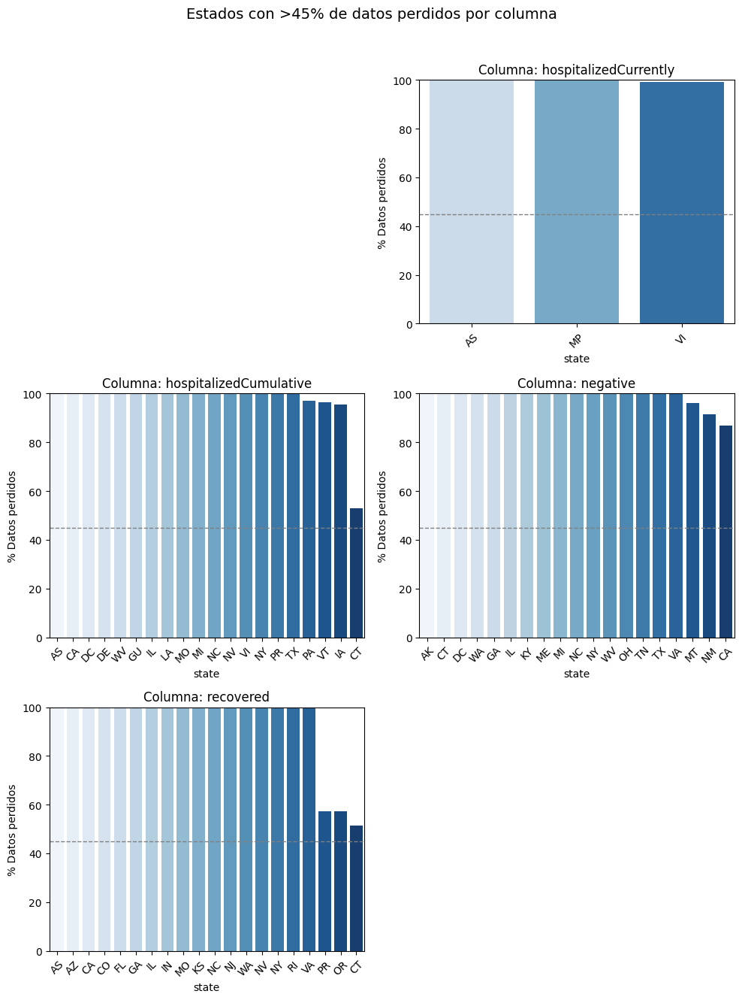

In [8]:
# Configuración general
columns_of_interest = ['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']


# Crear figura con subplots
fig, axes = plt.subplots(3, 2, figsize=(10, 13))
fig.suptitle('Estados con >45% de datos perdidos por columna', y=1.02, fontsize=14)

# Aplanar los ejes para facilitar el acceso
axes = axes.flatten()

for i, col in enumerate(columns_of_interest):
    # Filtrar estados con >45% NA en la columna actual
    filtered_data = perc_na[perc_na[col] > 45][[col]].sort_values(by=col, ascending=False)

    # Crear gráfico solo si hay datos
    if not filtered_data.empty:
        sns.barplot(x=filtered_data.index, y=filtered_data[col], ax=axes[i], palette='Blues')
        axes[i].set_title(f'Columna: {col}')
        axes[i].set_ylabel('% Datos perdidos')
        axes[i].set_ylim(0, 100)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].axhline(45, color='grey', linestyle='--', linewidth=1)  # Línea de referencia
    else:
        axes[i].set_visible(False)  # Ocultar subplot si no hay datos

# Eliminar el último subplot vacío (si hay 5 columnas en 3x2 grid)
axes[-1].set_visible(False)

plt.tight_layout()
plt.show()